In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

In [4]:
#-------------------------Different solvents--------------------------------------
address1 = "Different_solvents/"
img_1234TCB_CB = cv2.imread(address1 + '1234TCB_CB_sample90_BF_pol_2x.jpg',0)
img_135TCB_CB = cv2.imread(address1 + '135TCB_CB_sample12_BF_pol_2x.jpg',0)
img_135TCB_clform = cv2.imread(address1 + '135TCB_chcl3_sample7_BF_pol2_2x.jpg',0)
img_135TBB_CB = cv2.imread(address1 + '135TBB_CB_sample61_BF_pol_2x.jpg',0)
img_1245TCB_CB = cv2.imread(address1 + '1245TCB_CB_sample67_BF_pol_2x.jpg',0)
img_123TCB_CB = cv2.imread(address1 + '123TCB_CB_sample82_BF_pol_2x.jpg',0)

#--------------------DPPDTT------------------------------------------------
address2 = "DPPDTT/"
img_DPPDTT_10_sample1 = cv2.imread(address2 + 'DPPDTT10_sample1_BF_2X.jpg',0)
img_DPPDTT_10_sample2 = cv2.imread(address2 + 'DPPDTT10_sample2_BF_2X.jpg',0)
img_DPPDTT_10_sample3 = cv2.imread(address2 + 'DPPDTT10_sample3_BF_2X.jpg',0)
img_DPPDTT_10_sample4 = cv2.imread(address2 + 'DPPDTT10_sample4_BF_2X.jpg',0)
img_DPPDTT_10_sample5 = cv2.imread(address2 + 'DPPDTT10_sample5_BF_2X.jpg',0)
img_DPPDTT_10_sample6 = cv2.imread(address2 + 'DPPDTT10_sample6_BF_2X.jpg',0)
img_DPPDTT_10_sample7 = cv2.imread(address2 + 'DPPDTT10_sample7_BF_2X.jpg',0)
img_DPPDTT_10_sample8 = cv2.imread(address2 + 'DPPDTT10_sample8_BF_2X.jpg',0)
img_DPPDTT_10_sample9 = cv2.imread(address2 + 'DPPDTT10_sample9_BF_2X.jpg',0)
#img_DPPDTT_10_sample10 = cv2.imread(address2 + 'DPPDTT10_sample10_BF_2X.jpg',0)
img_DPPDTT_10_sample11 = cv2.imread(address2 + 'DPPDTT10_sample11_BF_2X.jpg',0)
img_DPPDTT_10_sample12 = cv2.imread(address2 + 'DPPDTT10_sample12_BF_2X.jpg',0)
img_DPPDTT_10_sample13 = cv2.imread(address2 + 'DPPDTT10_sample13_BF_2X.jpg',0)

dimDPP = 13
DPPDTT = []
for i in range(dimDPP):
    j = str(i+1)
    filename = "DPPDTT10_sample" + j + "_BF_2X.jpg"
    img = cv2.imread(address2 + filename,0)
    DPPDTT.append(img)
#print(DPPDTT[0])

In [15]:
#--------------------------------------------------------------
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=2,
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)
#--------------------------------------------------------------
def find_main_component_dft(image, numberofsample, exp, th):
    # dft and mag
    dftIm = cv2.dft(np.float32(image),flags = cv2.DFT_COMPLEX_OUTPUT)
    dftImShift = np.fft.fftshift(dftIm)
    magIm = 20*np.log(cv2.magnitude(dftImShift[:,:,0],dftImShift[:,:,1]))
    
    fig = plt.figure(figsize=(20,5))
    
    original = fig.add_subplot(141)
    plt.imshow(image, cmap = 'gray')
    plt.title('Original Image', fontsize=25)
    plt.xlabel('x', fontsize=20)
    plt.ylabel('y', fontsize=20)
    plt.xticks()
    plt.yticks()

    mag = fig.add_subplot(142)
    plt.imshow(magIm, cmap = 'gray')
    plt.title('Magnitude of FT', fontsize=25)
    plt.xlabel('$\omega_x$', fontsize=20)
    plt.ylabel('$\omega_y$', fontsize=20)
    plt.xticks()
    plt.yticks()
    plt.colorbar()
    
    # Threshold
    #selection of magnitudes for biary picture: if the element in magIm >= maxMag/5*th => element = maxMag,
    # else is 0.
    maxMag = np.max(magIm)
    ret, thresh = cv2.threshold(magIm, maxMag/5*th, maxMag, \
                                cv2.THRESH_BINARY)
    # Plot Threshold
    gradient = fig.add_subplot(143)
    plt.imshow(thresh, cmap = 'gray')
    plt.title('Magnitude Binary', fontsize=25)
    plt.xlabel('$\omega_x$', fontsize=20)
    plt.ylabel('$\omega_y$', fontsize=20)
    plt.xticks()
    plt.yticks()
    plt.grid(0)
    
    # Principal Component Analysis
    y,x = np.where(thresh == np.max(thresh))
    y = -y
    X = np.ones((len(x),2))
    X[:,0] = x; X[:,1] = y
    pca = PCA(n_components=2)
    pca.fit(X)
    #print(pca.components_)
    #print(pca.explained_variance_)
    #fig = plt.figure(figsize=(20,5))
    
    vec = fig.add_subplot(144)
    fig_scatter = plt.scatter(x,y)
        
    left  = 0.0  # the left side of the subplots of the figure
    right = 1.5    # the right side of the subplots of the figure
    bottom = 0.1   # the bottom of the subplots of the figure
    top = 1  # the top of the subplots of the figure
    wspace = 0.3   # the amount of width reserved for space between subplots,
               # expressed as a fraction of the average axis width
    hspace = 0.1   # the amount of height reserved for space between subplots,
               # expressed as a fraction of the average axis height
    plt.subplots_adjust(left, bottom, right, top,
                wspace, hspace)
    
    for sigma, direction in zip(pca.explained_variance_, pca.components_):
        v = direction.T * 2 * np.sqrt(sigma)
        zero = [np.mean(x), np.mean(y)]
        draw_vector(zero, zero - v)
    plt.axis('equal');
    
    print('''The angle between the main component and the horizontal is 
        \u03B1 = %2.3f \n''' % (np.arctan(pca.components_[0,1]/pca.components_[0,0])\
         /np.pi/2 * 360))
    print('''The angle between the second component and the horizontal is 
        \u03B2 = %2.3f \n''' % (np.arctan(-pca.components_[1,1]/pca.components_[1,0])\
         /np.pi/2 * 360))
    # pca.explained_variance_[0] = variance along pricipal comp
    # pca.explained_variance_[1] = variance along ortogonal comp
    print("The alignment factor is: %.3g" %  (pca.explained_variance_[1]/pca.explained_variance_[0]))
    
    plt.show()
    
    #saving figures of gradient and the vector:
    extent_grad = gradient.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    extent_vec = vec.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    
    if exp == 1:
        outputname_grad = ["135TCB_CB_sample12_grad.png", "135TCB_chcl3_sample7_grad.png", 
                              "135TBB_CB_sample61_grad.png", "1245TCB_CB_sample67_grad.png", 
                              "123TCB_CB_sample82_grad.png", "1234TCB_CB_sample90_grad.png"]
    
        outputname_vec = ["135TCB_CB_sample12_vec.png", "135TCB_chcl3_sample7_vec.png", 
                              "135TBB_CB_sample61_vec.png", "1245TCB_CB_sample67_vec.png", 
                              "123TCB_CB_sample82_vec.png", "1234TCB_CB_sample90_vec.png"]
    
        print(outputname_grad[numberofsample], "\n")
        fig.savefig(outputname_grad[numberofsample], bbox_inches=extent_grad.expanded(1.3, 1.3))
        fig.savefig(outputname_vec[numberofsample], bbox_inches=extent_vec.expanded(1.2, 1.1))
    
    if exp == 2:
        outputname_grad = "DPPDTT10_" + str(numberofsample+1) + "_original.png"
        outputname_vec = "DPPDTT10_" + str(numberofsample+1) + "_MAG.png"
        
        print(outputname_grad, "\n")
        fig.savefig(outputname_grad, bbox_inches=extent_grad.expanded(1.3, 1.3))
        fig.savefig(outputname_vec, bbox_inches=extent_vec.expanded(1.2, 1.1))

6
0
The angle between the main component and the horizontal is 
        α = 88.164 

The angle between the second component and the horizontal is 
        β = 1.836 

The alignment factor is: 0.292


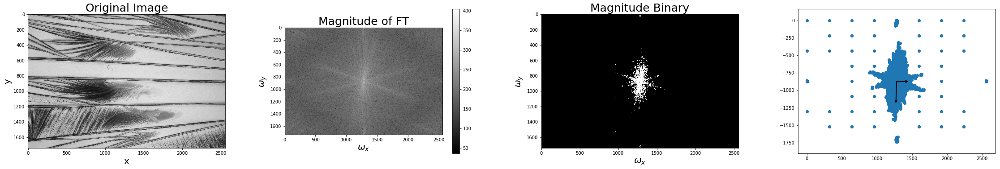

135TCB_CB_sample12_grad.png 

1
The angle between the main component and the horizontal is 
        α = 79.696 

The angle between the second component and the horizontal is 
        β = 10.304 

The alignment factor is: 0.0487


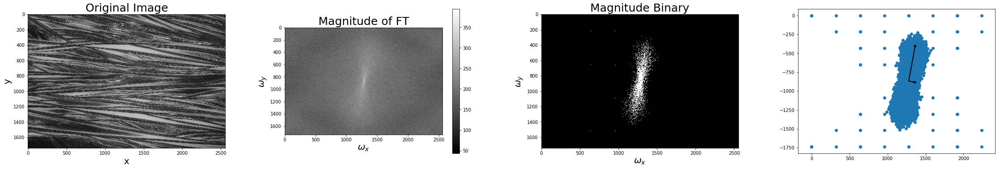

135TCB_chcl3_sample7_grad.png 

2
The angle between the main component and the horizontal is 
        α = 80.280 

The angle between the second component and the horizontal is 
        β = 9.720 

The alignment factor is: 0.0472


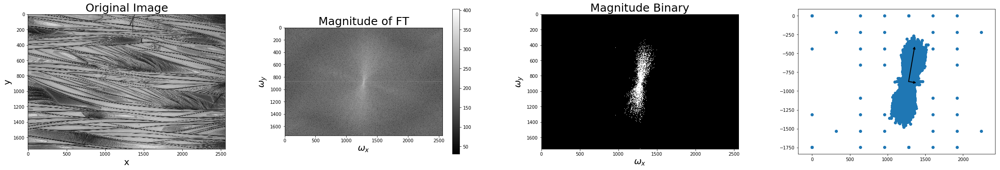

135TBB_CB_sample61_grad.png 

3
The angle between the main component and the horizontal is 
        α = 83.866 

The angle between the second component and the horizontal is 
        β = 6.134 

The alignment factor is: 0.455


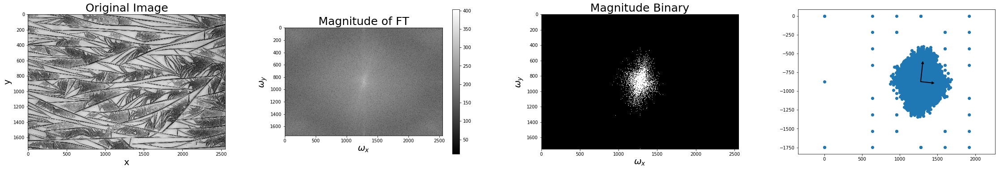

1245TCB_CB_sample67_grad.png 

4
The angle between the main component and the horizontal is 
        α = 71.161 

The angle between the second component and the horizontal is 
        β = 18.839 

The alignment factor is: 0.0277


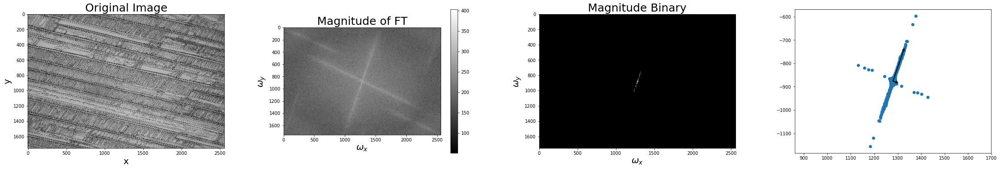

123TCB_CB_sample82_grad.png 

5
The angle between the main component and the horizontal is 
        α = 86.420 

The angle between the second component and the horizontal is 
        β = 3.580 

The alignment factor is: 0.00642


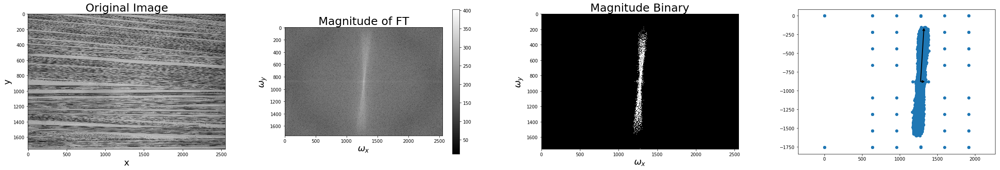

1234TCB_CB_sample90_grad.png 



In [16]:
# U should call the images with second parameter 3
# Only when u call 'img_123TCB_CB', use 3.5 !!! --------> why????

#calcola la funzione per tutti i files di "different solid solvents"

#array delle immagini:
images_exp1 = [img_135TCB_CB, img_135TCB_clform, img_135TBB_CB, img_1245TCB_CB, img_123TCB_CB, img_1234TCB_CB]
dim = len(images_exp1)
print(dim)

thresh = [2.9,3.,3.,3.,3.5,3.]

for i in range(dim):
    print(i) 
    find_main_component_dft(images_exp1[i], i, 1, thresh[i])

0
The angle between the main component and the horizontal is 
        α = 86.950 

The angle between the second component and the horizontal is 
        β = 3.050 



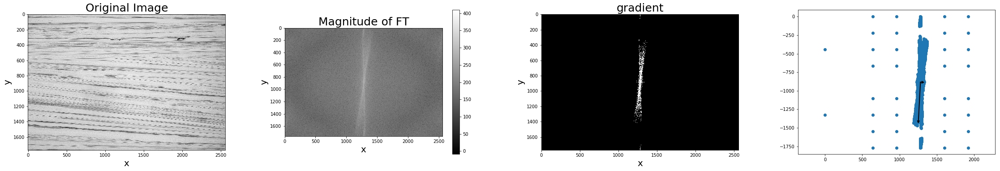

DPPDTT10_2_original.png 

1
The angle between the main component and the horizontal is 
        α = 89.926 

The angle between the second component and the horizontal is 
        β = 0.074 



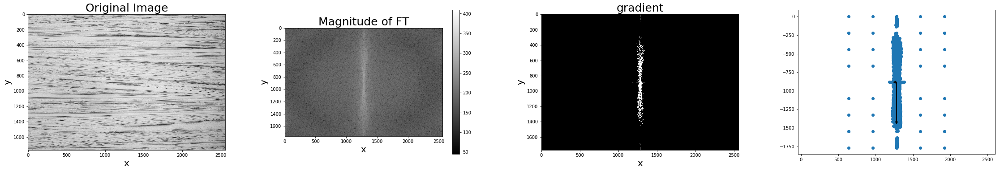

DPPDTT10_3_original.png 

2
The angle between the main component and the horizontal is 
        α = -60.862 

The angle between the second component and the horizontal is 
        β = -29.138 



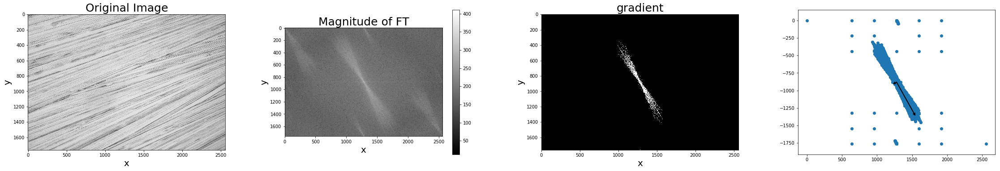

DPPDTT10_4_original.png 

3
The angle between the main component and the horizontal is 
        α = -82.580 

The angle between the second component and the horizontal is 
        β = -7.420 



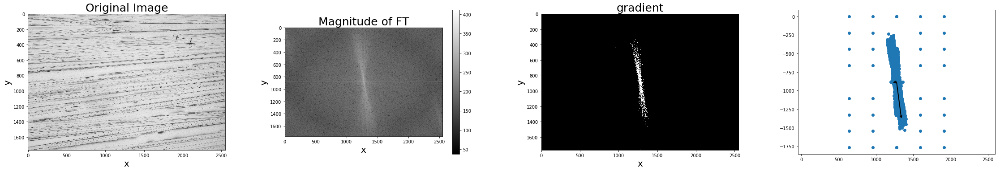

DPPDTT10_5_original.png 

4
The angle between the main component and the horizontal is 
        α = 60.181 

The angle between the second component and the horizontal is 
        β = 29.819 



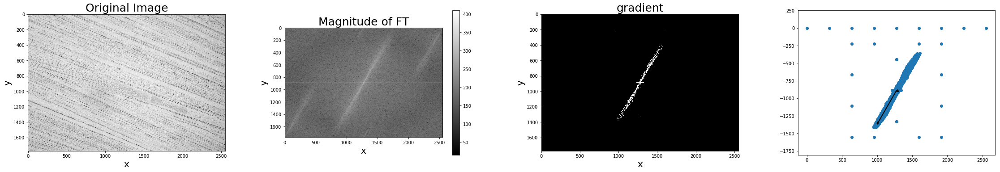

DPPDTT10_6_original.png 

5
The angle between the main component and the horizontal is 
        α = 86.083 

The angle between the second component and the horizontal is 
        β = 3.917 



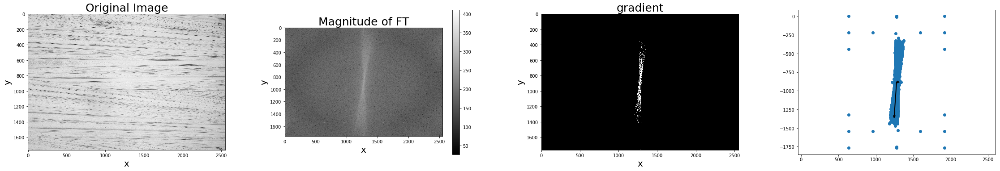

DPPDTT10_7_original.png 

6
The angle between the main component and the horizontal is 
        α = 66.021 

The angle between the second component and the horizontal is 
        β = 23.979 



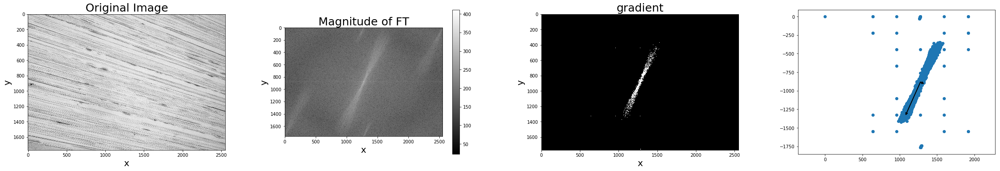

DPPDTT10_8_original.png 

7
The angle between the main component and the horizontal is 
        α = 77.103 

The angle between the second component and the horizontal is 
        β = 12.897 



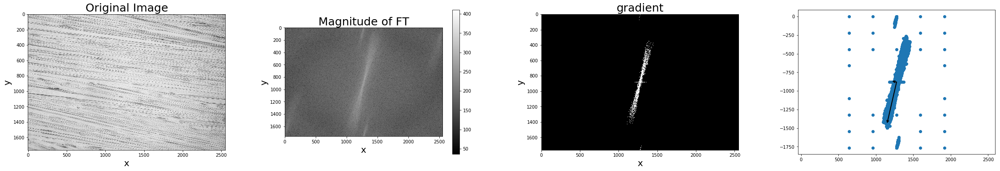

DPPDTT10_9_original.png 

8
The angle between the main component and the horizontal is 
        α = 47.043 

The angle between the second component and the horizontal is 
        β = 42.957 



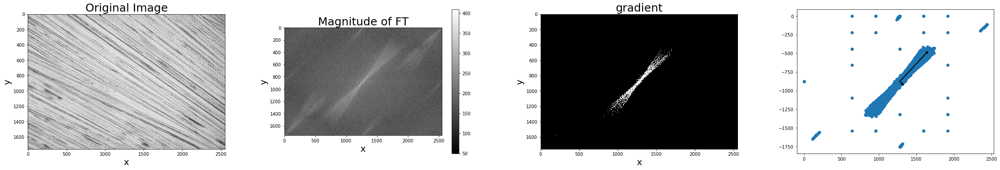

DPPDTT10_10_original.png 

9
The angle between the main component and the horizontal is 
        α = -63.868 

The angle between the second component and the horizontal is 
        β = -26.132 



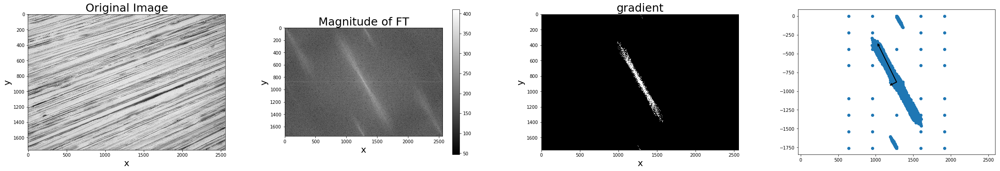

DPPDTT10_11_original.png 

10
The angle between the main component and the horizontal is 
        α = -63.868 

The angle between the second component and the horizontal is 
        β = -26.132 



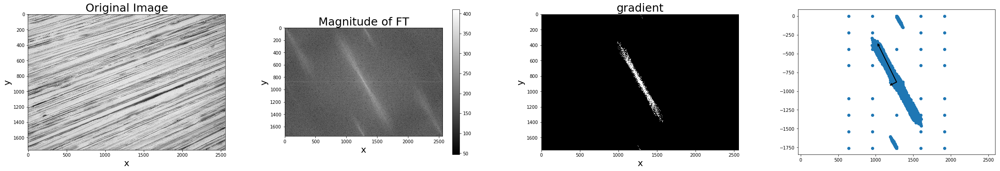

DPPDTT10_12_original.png 

11
The angle between the main component and the horizontal is 
        α = 57.924 

The angle between the second component and the horizontal is 
        β = 32.076 



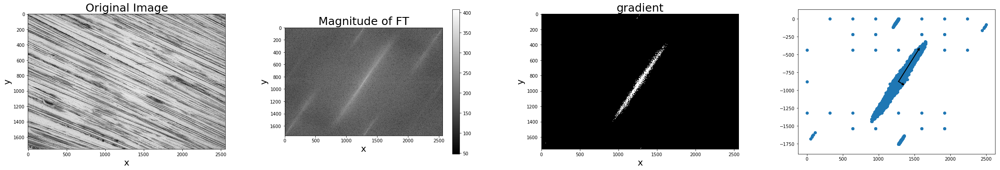

DPPDTT10_13_original.png 

12
The angle between the main component and the horizontal is 
        α = 53.791 

The angle between the second component and the horizontal is 
        β = 36.209 



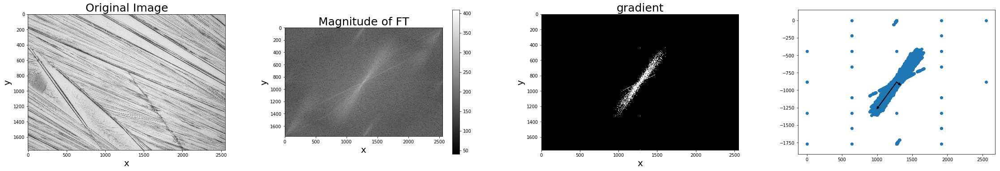

DPPDTT10_14_original.png 



In [9]:
#fare loop sui files DPPDTT
for i in range(dimDPP):
    print(i)
    find_main_component_dft(DPPDTT[i], i+1, 2, 3.)